<a href="https://colab.research.google.com/github/rodrigues177/Q00118/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Asteroid Classification**

---
To gain insights into the characteristics of asteroids that could potentially impact Earth and to analyze this data and identify patterns and trends that can inform recommendations for monitoring and preventing potentially hazardous asteroid impacts.

# Exploratory Data Analysis

In [ ]:
!pip install git+https://github.com/rodrigues177/Q00118.git@main

Import Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import io
import time

Uploading the Asteroid csv file

In [ ]:
#upload the asteroid csv file here
from google.colab import files
uploaded = files.upload()

Saving asteroid_dataset.csv to asteroid_dataset.csv


Creating a Dataframe from the csv file and seeing its contents

In [ ]:
df = pd.read_csv(io.BytesIO(uploaded['asteroid_dataset.csv']))
df.head()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,...,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.3,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,...,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,...,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


Checking any null values in the dataset
*   No null values

In [ ]:
#Check Any Null Values --> No Null Values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4687 entries, 0 to 4686
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Neo Reference ID              4687 non-null   int64  
 1   Name                          4687 non-null   int64  
 2   Absolute Magnitude            4687 non-null   float64
 3   Est Dia in KM(min)            4687 non-null   float64
 4   Est Dia in KM(max)            4687 non-null   float64
 5   Est Dia in M(min)             4687 non-null   float64
 6   Est Dia in M(max)             4687 non-null   float64
 7   Est Dia in Miles(min)         4687 non-null   float64
 8   Est Dia in Miles(max)         4687 non-null   float64
 9   Est Dia in Feet(min)          4687 non-null   float64
 10  Est Dia in Feet(max)          4687 non-null   float64
 11  Close Approach Date           4687 non-null   object 
 12  Epoch Date Close Approach     4687 non-null   int64  
 13  Rel

Basic Descriptive Statistics of Dataset

In [ ]:
#See Basic Descriptive Statistics
df.describe()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion
count,4.687000e+03,4.687000e+03,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,...,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,4687.000000,4.687000e+03,4687.000000,4687.000000
mean,3.272298e+06,3.272298e+06,22.267865,0.204604,0.457509,204.604203,457.508906,0.127135,0.284283,671.273653,...,1.400264,13.373844,172.157275,635.582076,0.813383,183.932151,1.987144,2.457728e+06,181.167927,0.738242
std,5.486011e+05,5.486011e+05,2.890972,0.369573,0.826391,369.573402,826.391249,0.229642,0.513496,1212.511199,...,0.524154,10.936227,103.276777,370.954727,0.242059,103.513035,0.951519,9.442264e+02,107.501623,0.342627
min,2.000433e+06,2.000433e+06,11.160000,0.001011,0.002260,1.010543,2.259644,0.000628,0.001404,3.315431,...,0.615920,0.014513,0.001941,176.557161,0.080744,0.006918,0.803765,2.450100e+06,0.003191,0.086285
25%,3.097594e+06,3.097594e+06,20.100000,0.033462,0.074824,33.462237,74.823838,0.020792,0.046493,109.784247,...,1.000635,4.962341,83.081208,365.605031,0.630834,95.625916,1.266059,2.457815e+06,87.006918,0.453289
50%,3.514799e+06,3.514799e+06,21.900000,0.110804,0.247765,110.803882,247.765013,0.068850,0.153954,363.529809,...,1.240981,10.311836,172.625393,504.947292,0.833153,189.761641,1.618195,2.457973e+06,185.718889,0.712946
75%,3.690060e+06,3.690060e+06,24.500000,0.253837,0.567597,253.837029,567.596853,0.157727,0.352688,832.798679,...,1.678364,19.511681,255.026909,794.195972,0.997227,271.777557,2.451171,2.458108e+06,276.531946,0.984669
max,3.781897e+06,3.781897e+06,32.100000,15.579552,34.836938,15579.552413,34836.938254,9.680682,21.646663,51114.018738,...,5.072008,75.406667,359.905890,4172.231343,1.299832,359.993098,8.983852,2.458839e+06,359.917991,2.039000


Checking balance of dataset
*   Imbalanced
*   5x more non-hazardous asteroids than hazardous asteroids

In [ ]:
df['Hazardous'].value_counts()


False    3932
True      755
Name: Hazardous, dtype: int64

[Text(0, 0, '3932'), Text(0, 0, '755')]

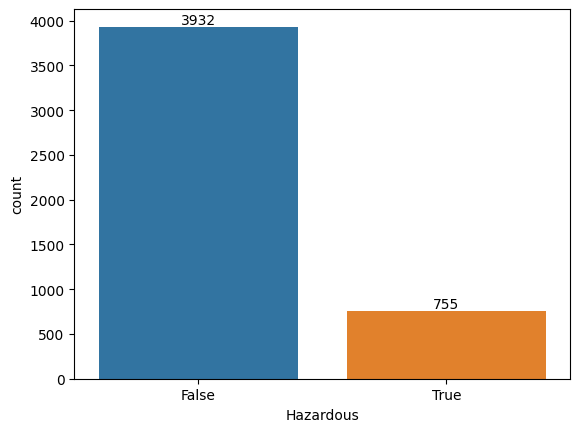

In [ ]:
#Check Number of Hazardous --> Imbalanced Dataset
import seaborn as sns
ax = sns.countplot(x = df['Hazardous'])
ax.bar_label(ax.containers[0])

Pre-Processing Dataset: 
*   Normalization of Data
*   Removing same features of differing units 
*   Removing features regarding identification/timing


In [ ]:
#Normalize Dataset
from sklearn.preprocessing import MinMaxScaler

trans = MinMaxScaler()
new_df = df.select_dtypes(exclude=['object'])
new_df = new_df.loc[:, ~new_df.columns.isin(['Neo Reference ID', 'Name', 'Orbit ID','Epoch Date Close Approach','Epoch Osculation','Perihelion Time', 'Est Dia in KM(min)','Est Dia in M(min)','Est Dia in M(max)','Est Dia in Miles(min)','Est Dia in Miles(max)','Est Dia in Feet(min)','Est Dia in Feet(max)','Relative Velocity km per sec','Miles per hour','Miss Dist.(Astronomical)','Miss Dist.(lunar)','Miss Dist.(miles)']) ]
norm_array = trans.fit_transform(new_df)
norm_df = pd.DataFrame(norm_array, columns = new_df.columns)
norm_df

,Absolute Magnitude,Est Dia in KM(max),Relative Velocity km per hr,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Mean Anomaly,Mean Motion,Hazardous
0,0.498567,0.008101,0.130487,0.839102,0.555556,0.052899,0.357007,0.438763,0.177530,0.079736,0.873489,0.108378,0.596770,0.159035,0.146942,0.735825,0.258239,1.0
1,0.484241,0.009311,0.401336,0.766123,0.333333,0.391164,0.477522,0.361224,0.110378,0.376677,0.379866,0.062396,0.522896,0.869714,0.084790,0.482720,0.388713,0.0
2,0.436485,0.014795,0.163781,0.101616,0.000000,0.090096,0.345731,0.357628,0.189158,0.056020,0.720954,0.116882,0.713687,0.690049,0.142186,0.813777,0.242271,1.0
3,0.775549,0.000500,0.244668,0.570624,0.666667,0.011529,0.424220,0.219426,0.143620,0.104671,0.158852,0.084473,0.740847,0.051949,0.088525,0.190984,0.314430,0.0
4,0.498567,0.008101,0.214576,0.815788,0.111111,0.072812,0.433153,0.212992,0.136823,0.222555,0.235139,0.079847,0.727546,0.439619,0.083102,0.375475,0.327805,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4682,0.608405,0.002767,0.492542,0.082415,0.888889,0.041379,0.433446,0.371550,0.122419,0.528782,0.456181,0.070232,0.542056,0.767776,0.095052,0.845486,0.359065,0.0
4683,0.813754,0.000326,0.065232,0.012589,0.666667,0.013494,0.519256,0.068936,0.103053,0.070906,0.959210,0.057720,0.751127,0.116960,0.042795,0.786229,0.408576,0.0
4684,0.551098,0.004856,0.154772,0.121733,0.666667,0.125490,0.324206,0.378417,0.204734,0.058242,0.102873,0.128513,0.725966,0.763045,0.157326,0.565406,0.222978,0.0
4685,0.508118,0.007383,0.248691,0.521470,0.555556,0.371442,0.334017,0.204718,0.195391,0.279415,0.455124,0.121504,0.906189,0.500961,0.120288,0.565472,0.234280,0.0


Distribution of Remaining Characteristics
*   Some are left-skewed
*   Only a few are normally-distributed

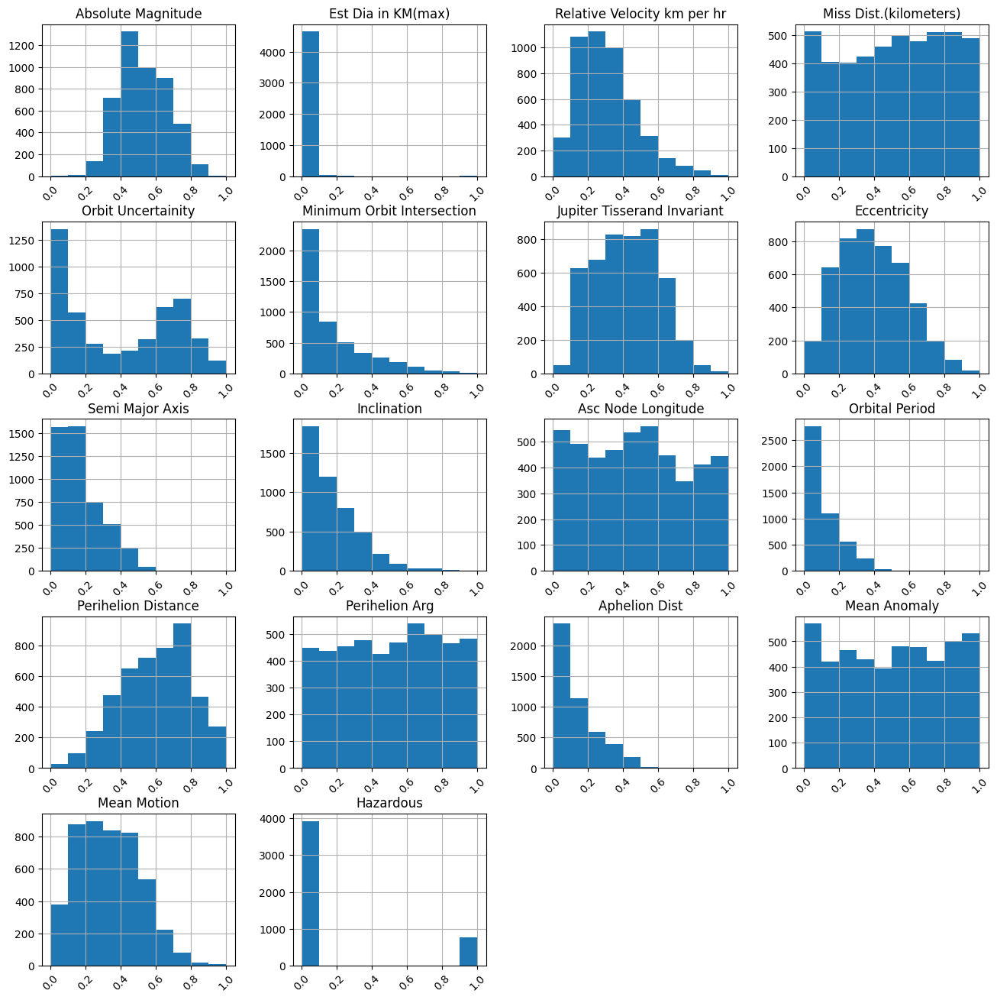

In [ ]:
#See Visualization of each Characteristics
norm_df.hist(figsize=(16,16), xrot=45)
plt.show()

Correlation of Characteristics via Heatmap

We found three main groups (in descending order of correlation):
*   Jupiter Tisserand Invariant, Mean Motion, Aphelion Distance, Orbital Period, Semi Major Axis (~0.9)
*   Eccentricity, Aphelion Distance (~0.7)
*   Absolute Magnitude, Estimated Diameter in Km (max) (~0.6)

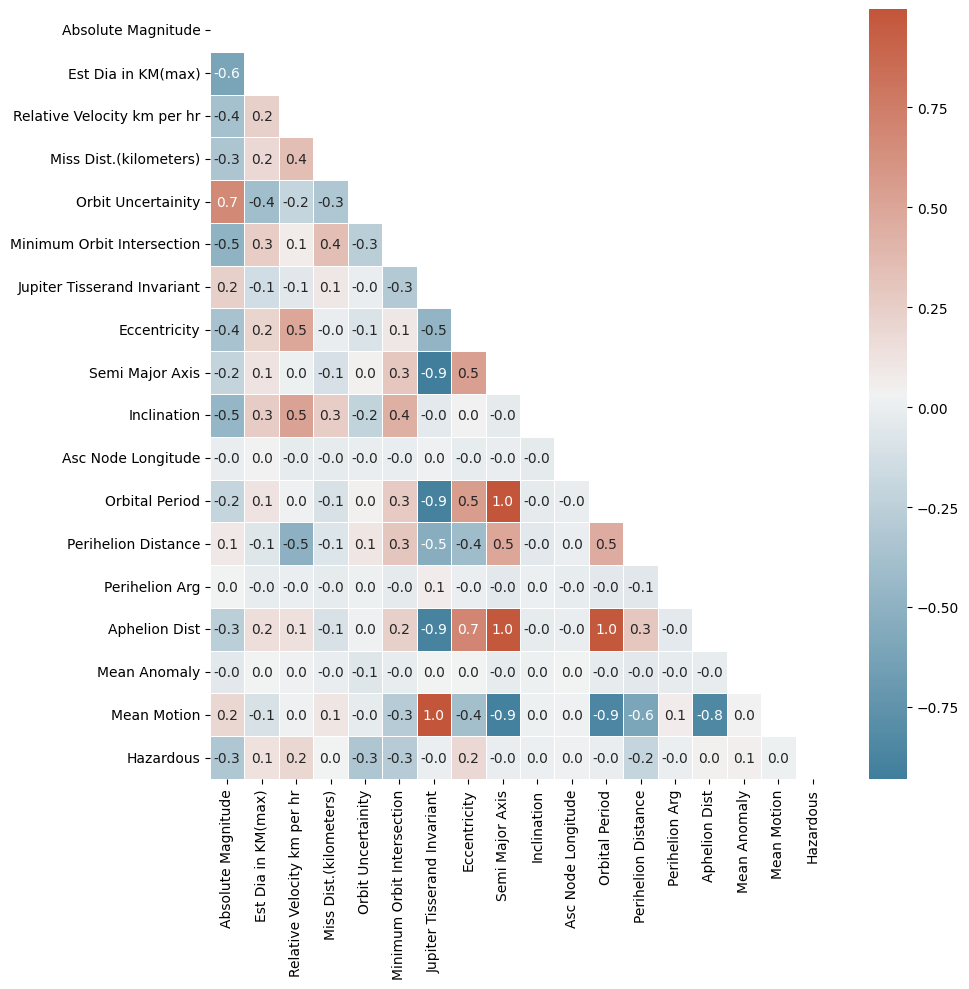

In [ ]:
#Correlation
corr_matrix = norm_df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(corr_matrix, mask = mask, cmap = cmap, annot=True, fmt=".1f", linewidths=.5, ax=ax)
plt.show()

Pairplot amongst Features with distribution of Hazardous and Non-hazardous Asteroids

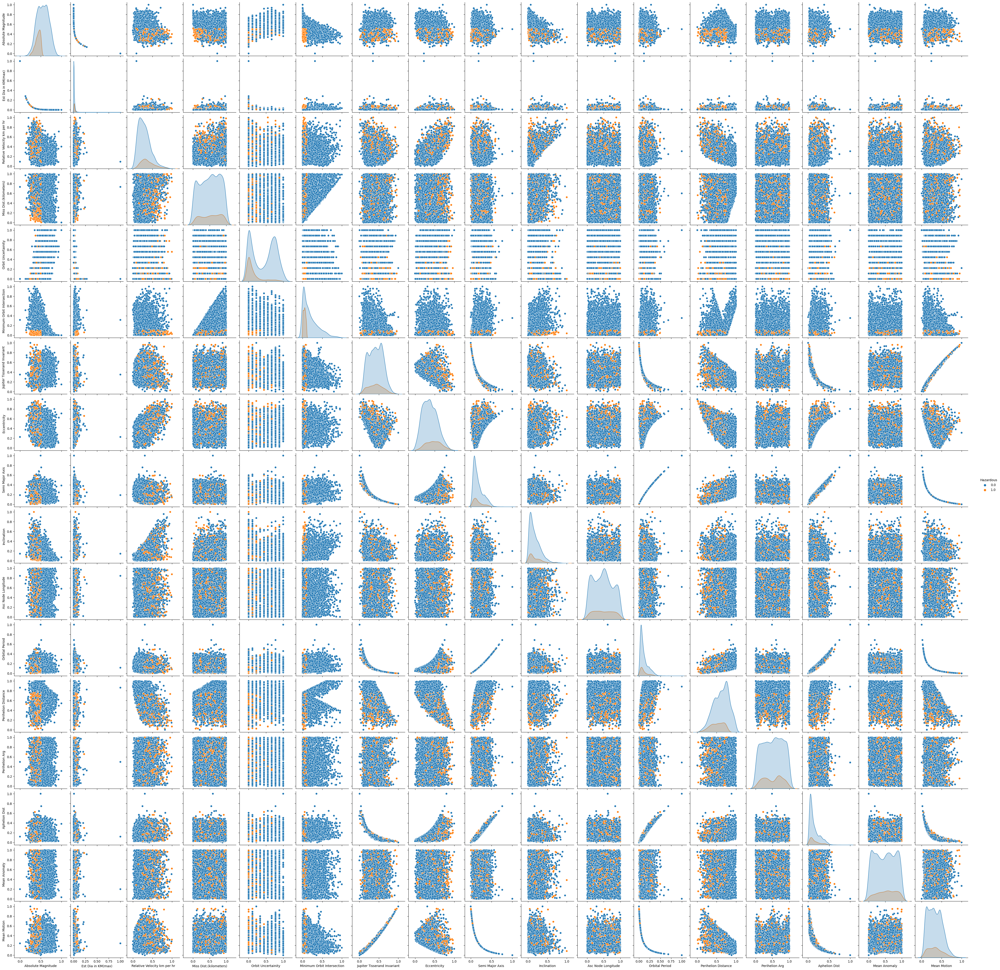

In [ ]:
sns.pairplot(norm_df, hue="Hazardous")
plt.show()

# Machine Learning

## Neural Network

In [ ]:
# Importing libraries
from sklearn.model_selection import train_test_split

# Dividing the data
x = norm_df.loc[:, norm_df.columns != "Hazardous"]
y = norm_df["Hazardous"]

# Split the data into training and test sets (random state is from Tiago's student number: Q00118)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.15, random_state = 118)

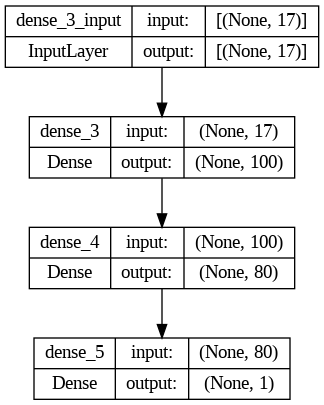

In [ ]:
# Importing libraries
import tensorflow.keras as keras
from keras import layers
from keras import metrics
from keras.utils.vis_utils import plot_model

# Defining the architecture of the model

## Only 3 layers (Faster to compute, but complex enough)
## Relu in the first hidden layer since it is a fast to train
## Sigmoid in the last layer since we want a probability

model = keras.models.Sequential()
model.add(layers.Dense(100, activation = "relu", input_shape=(len(x.columns),)))
model.add(layers.Dense(80, activation = "relu"))
model.add(layers.Dense(1, activation = "sigmoid"))

# Visualizing the model architecture
plot_model(model, to_file = "NN_AC.png", show_shapes=True, show_layer_names=True)

In [ ]:
# Compiling the model

## Loss: binary_crossentropy is the most adequate to binary classification
## Optimizer: adam, a more efficient stochastic gradient descent
## Metrics: AUC and F1-score, since we have a very unbalanced data set and accuracy is a bad measure

model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = [metrics.AUC(name = "auc")])

In [ ]:
# Training the model

## Using Mini-batch Gradient Descent (5 batches) since it is faster then BGD and less prone to bounce infinitely like SGD

t0 = time.time()
history = model.fit(x_train, y_train, epochs = 100, batch_size=5, verbose=1)
nn_training_time = time.time()-t0

Epoch 1/100
797/797 [==============================] - 3s 2ms/step - loss: 0.2669 - auc: 0.9093
Epoch 2/100
797/797 [==============================] - 2s 2ms/step - loss: 0.1569 - auc: 0.9721
Epoch 3/100
797/797 [==============================] - 2s 2ms/step - loss: 0.1284 - auc: 0.9816
Epoch 4/100
797/797 [==============================] - 2s 2ms/step - loss: 0.1205 - auc: 0.9832
Epoch 5/100
797/797 [==============================] - 2s 2ms/step - loss: 0.1061 - auc: 0.9870
Epoch 6/100
797/797 [==============================] - 2s 2ms/step - loss: 0.0962 - auc: 0.9891
Epoch 7/100
797/797 [==============================] - 2s 2ms/step - loss: 0.0908 - auc: 0.9907
Epoch 8/100
797/797 [==============================] - 2s 3ms/step - loss: 0.0856 - auc: 0.9919
Epoch 9/100
797/797 [==============================] - 2s 2ms/step - loss: 0.0746 - auc: 0.9940
Epoch 10/100
797/797 [==============================] - 2s 2ms/step - loss: 0.0726 - auc: 0.9942
Epoch 11/100
797/797 [=================

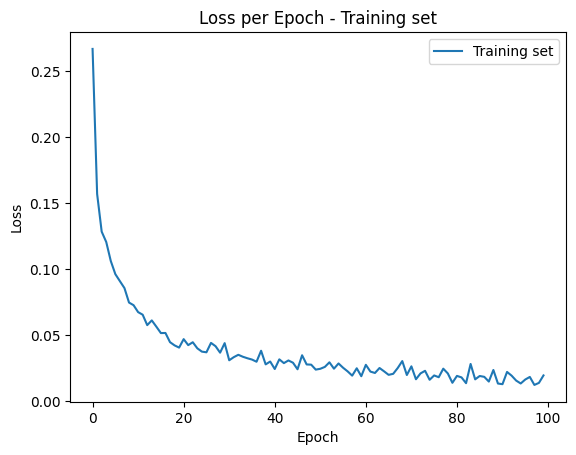

In [ ]:
# Ploting loss per epoch

plt.plot(history.history["loss"], label = f"Training set")
plt.title("Loss per Epoch - Training set")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.plot()
plt.show()

22/22 [==============================] - 0s 1ms/step


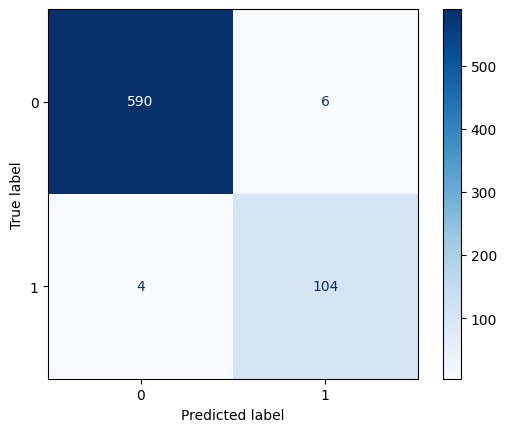

In [ ]:
# Creating a Confusion matrix with the predictions of the model on the testing set
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict the probability for each class
probabilities = model.predict(x_test)

# Since a False Negative is more dangerous then a False Positive (we want to identify all possible threats), we will set the threshold below 0.5
# Besides that, since our data set is very unbalanced towards 0, the predictions are also biased towards 0
threshold = 0.5

y_pred = np.where(probabilities > threshold, 1, 0)

# Building and displaying the confusion matrix
cm = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred))
cm.plot(cmap = plt.cm.Blues)
plt.show()

In [ ]:
probabilities = model.predict(x_test)
y_pred = np.where(probabilities > 0.5, 1, 0)

# Computing Accuracy, Precision, Recall, F1-Score and AUC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

acc_nn = round(accuracy_score(y_test,y_pred), 4)
precision_nn = round(precision_score(y_test,y_pred), 4)
recall_nn = round(recall_score(y_test,y_pred), 4)
f1_score_nn = round(f1_score(y_test,y_pred), 4)
auc_nn = round(roc_auc_score(y_test,probabilities), 4)

print("Accuracy =", acc_nn)
print("Precision =", precision_nn)
print("Recall =", recall_nn)
print("F1 Score =", f1_score_nn)
print("Area Under the Curve =", auc_nn)

22/22 [==============================] - 1s 13ms/step
Accuracy = 0.9858
Precision = 0.9455
Recall = 0.963
F1 Score = 0.9541
Area Under the Curve = 0.9987


22/22 [==============================] - 0s 1ms/step


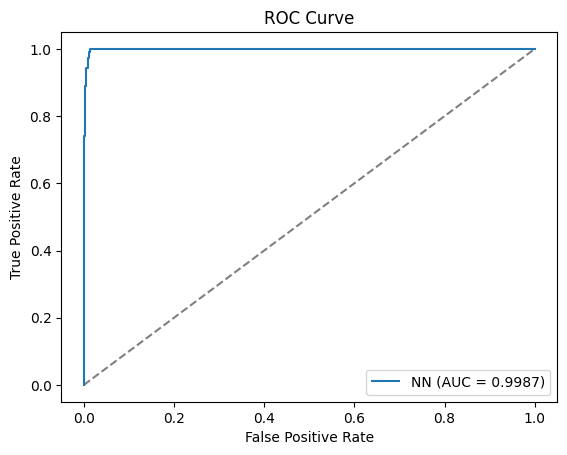

In [ ]:
from sklearn.metrics import roc_curve, auc

probabilities = model.predict(x_test)

# Building a ROC curve
fpr_nn, tpr_nn, thresholds_nn = roc_curve(y_test, probabilities)
auc_nn = round(auc(fpr_nn, tpr_nn), 4)

plt.figure(1)
plt.plot([0, 1], [0, 1], '--', color = "grey")
plt.plot(fpr_nn, tpr_nn, label = f"NN (AUC = {auc_nn})")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

## kNN Model

Split the data into training and test sets

In [ ]:
from sklearn.model_selection import train_test_split

# Dividing the data
x = norm_df.loc[:, norm_df.columns != "Hazardous"]
y = norm_df["Hazardous"]

# Split the data into training and test sets 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.15, random_state = 0)

Feature Scaling

In [ ]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(x_train)
X_test = sc.transform(x_test)

Determing number of neighbours
*   3 neighbours is best for a more accurate model with less overfitting


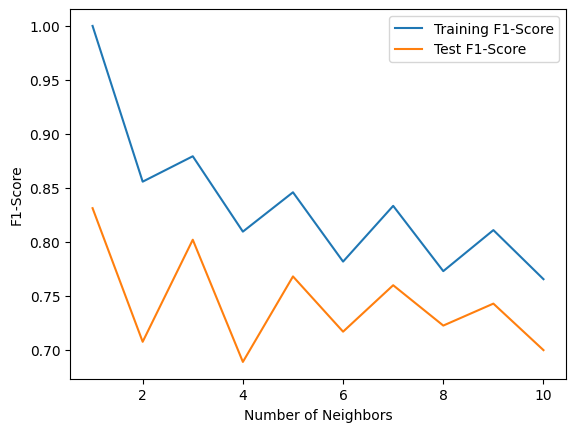

In [ ]:
#Determine number of neighbours first
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score

train_f1_score = []
test_f1_score= []

# try n_neighbors from 1 to 10
neighbors_settings = range(1, 11)

for n_neighbors in neighbors_settings:
    # build the model
    classifier = KNeighborsClassifier(n_neighbors = n_neighbors, metric = 'minkowski', p = 1)
    classifier.fit(X_train, y_train)
    # making the predictions
    y_pred_train = classifier.predict(X_train)
    y_pred_test = classifier.predict(X_test)
    # record training set accuracy
    train_f1_score.append(f1_score(y_train, y_pred_train))
    # record generalization accuracy
    test_f1_score.append(f1_score(y_test, y_pred_test))
    
plt.plot(neighbors_settings, train_f1_score, label="Training F1-Score")
plt.plot(neighbors_settings, test_f1_score, label="Test F1-Score")
plt.ylabel("F1-Score")
plt.xlabel("Number of Neighbors")
plt.legend()

Fitting kNN to Training Set

In [ ]:
# Fitting K-NN to the Training set
knn = KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 1)
t0 = time.time()
knn.fit(X_train, y_train)
knn_training_time = time.time() - t0

In [ ]:
#Predicting the Test set results
y_pred = knn.predict(X_test)

Confusion Matrix Results and Visualisation

In [ ]:
# Computing Accuracy, Precision, Recall and F1 Score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

acc_knn = round(accuracy_score(y_test,y_pred), 4)
precision_knn = round(precision_score(y_test,y_pred), 4)
recall_knn = round(recall_score(y_test,y_pred), 4)
f1_score_knn = round(f1_score(y_test,y_pred), 4)

print("Accuracy =", acc_knn)
print("Precision =", precision_knn)
print("Recall =", recall_knn)
print("F1 Score =", f1_score_knn)

Accuracy = 0.9375
Precision = 0.7876
Recall = 0.8165
F1 Score = 0.8018


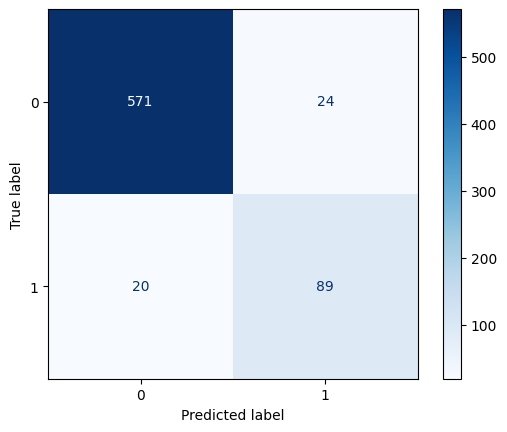

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Building and displaying the confusion matrix
cm = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred))
cm.plot(cmap = plt.cm.Blues)
plt.show()

## SVM

SVM doesn't give probabilities (auc is not a good measure) and the data set is unbalanced, so we will mostly use f1-score to measure model quality.

In [ ]:
from sklearn.model_selection import train_test_split

# Dividing the data
x = norm_df.loc[:, norm_df.columns != "Hazardous"]
y = norm_df["Hazardous"]

# Split the data into training and test sets (random state is from Yeoshi's student number: E13329)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.15, random_state = 13329)

F1-score: Fold Number 1: 0.752
F1-score: Fold Number 2: 0.8745247148288974
F1-score: Fold Number 3: 0.7951807228915662


F1-score: Fold Number 4: 0.40366972477064217
F1-score: Fold Number 5: 0.763157894736842
Mean F1-score: 0.7177 +/- 0.1628


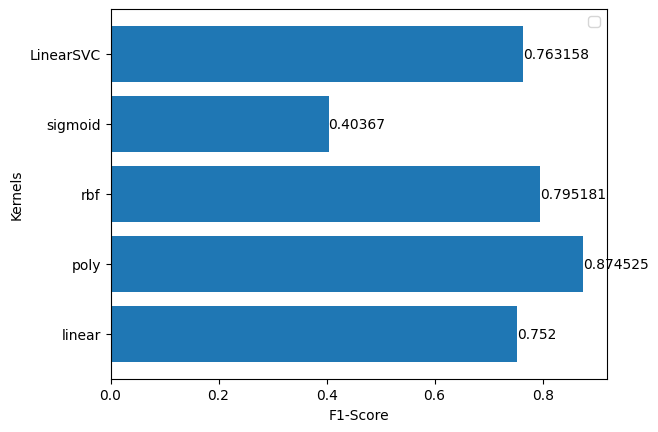

In [ ]:
#Cross validation
from sklearn.svm import LinearSVC, SVC
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold

# Kernels choosen:
kernels = ["linear", "poly", "rbf", "sigmoid"]
# Also adding later the LinearSVC later
## Note: the difference between the LinearSVC and SVC(kernel = "linear") is the loss function. LinearSVC uses hinge and SVC(kernel = "linear") uses squared_hinge

# Optimize using F1-Score (AUC is useless since SVM only gives 1 and 0 predictions, not probabilities)
f1_svc_score = []

# Number of folds equal to the number of possible different kernels ()
cv_folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

# Calculating F1-score for each different model/ split

for i, (train_index, test_index) in enumerate(cv_folds.split(x_train, y_train)):
  X_train, X_test = x_train.iloc[train_index], x_train.iloc[test_index]
  Y_train, Y_test = y_train.iloc[train_index], y_train.iloc[test_index]
  if i != 4:
    # Define the model
    svc = SVC(kernel = kernels[i], random_state = 1)
    # Train the model
    svc.fit(X_train, Y_train)
    # Making the predictions
    Y_pred = svc.predict(X_test)
    # Evaluating the model
    f1_svc_score.append(f1_score(Y_test, Y_pred))
    print(f"F1-score: Fold Number {i+1}: {f1_svc_score[i]}")  
  else:
    # Define the model
    svc = LinearSVC(random_state = 1)
    # Train the model
    svc.fit(X_train, Y_train)
    # Making the predictions
    Y_pred = svc.predict(X_test)
    # Evaluating the model
    f1_svc_score.append(f1_score(Y_test, Y_pred))
    print(f"F1-score: Fold Number {i+1}: {f1_svc_score[i]}")  

# So we can plot everything together
kernels.append("LinearSVC")

# Printing the results
mean_f1_svc_score = np.mean(f1_svc_score)
std_f1_svc_score = np.std(f1_svc_score)
print(f"Mean F1-score: {mean_f1_svc_score:.4f} +/- {std_f1_svc_score:.4f}")

# Ploting the results

a1 = plt.barh(kernels, f1_svc_score)
plt.bar_label(a1)
plt.xlabel("F1-Score")
plt.ylabel("Kernels")
plt.legend()

SVM with poly kernel got the best score. A Neural Network still has a much better F1-score then the SVM, so we will use ensemble learning on the SVM.

In [ ]:
# Result on the testing set:

svc = SVC(kernel = "poly", random_state = 1)
# Train the model
t0 = time.time()
svc.fit(x_train, y_train)
svc_training_time = time.time() - t0
# Making the predictions
y_pred = svc.predict(x_test)

# Computing Accuracy, Precision, Recall and F1 Score
acc_svc = round(accuracy_score(y_test,y_pred), 4)
precision_svc = round(precision_score(y_test,y_pred), 4)
recall_svc = round(recall_score(y_test,y_pred), 4)
f1_score_svc = round(f1_score(y_test,y_pred), 4)

print("Accuracy =", acc_svc)
print("Precision =", precision_svc)
print("Recall =", recall_svc)
print("F1 Score =", f1_score_svc)

Accuracy = 0.9616
Precision = 0.8835
Recall = 0.8585
F1 Score = 0.8708


## Bagging model (with SVM)

In [ ]:
from sklearn.model_selection import train_test_split

# Dividing the data
x = norm_df.loc[:, norm_df.columns != "Hazardous"]
y = norm_df["Hazardous"]

# Split the data into training and test sets 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.15, random_state = 5165)

In [ ]:
# Bagging

from sklearn.ensemble import BaggingClassifier

bclf = BaggingClassifier(estimator = SVC(kernel = "poly"), random_state=1)

t0 = time.time()
bclf.fit(x_train, y_train)
bclf_training_time = time.time() - t0

y_pred = bclf.predict(x_test)

# Computing Accuracy, Precision, Recall and F1 Score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

acc_bclf = round(accuracy_score(y_test,y_pred), 4)
precision_bclf = round(precision_score(y_test,y_pred), 4)
recall_bclf = round(recall_score(y_test,y_pred), 4)
f1_score_bclf = round(f1_score(y_test,y_pred), 4)

print("Accuracy =", acc_bclf)
print("Precision =", precision_bclf)
print("Recall =", recall_bclf)
print("F1 Score =", f1_score_bclf)

Accuracy = 0.9531
Precision = 0.8257
Recall = 0.8654
F1 Score = 0.8451


## Stacking model

Now, we are trying a Stacking model using our best SVM and best KNN

In [ ]:
from sklearn.model_selection import train_test_split

# Dividing the data
x = norm_df.loc[:, norm_df.columns != "Hazardous"]
y = norm_df["Hazardous"]

# Split the data into training and test sets 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.15, random_state = 10)

In [ ]:
# Stacking using the best SVM and the best KNN
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from IPython.display import display

estimators = [("svm", SVC(kernel = "poly")), ("knn", make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 1)))]
#estimators = [("svm", LinearSVC()), ("knn", make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 3, metric = 'minkowski', p = 1)))]

# Using a logistic regression as final estimator so we can get probabilities instead of 0 or 1 predictions
sclf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(random_state=0))

t0 = time.time()
display(sclf.fit(x_train, y_train))
sclf_training_time = time.time()-t0

StackingClassifier(estimators=[('svm', SVC(kernel='poly')),
                               ('knn',
                                Pipeline(steps=[('standardscaler',
                                                 StandardScaler()),
                                                ('kneighborsclassifier',
                                                 KNeighborsClassifier(n_neighbors=3,
                                                                      p=1))]))],
                   final_estimator=LogisticRegression(random_state=0))

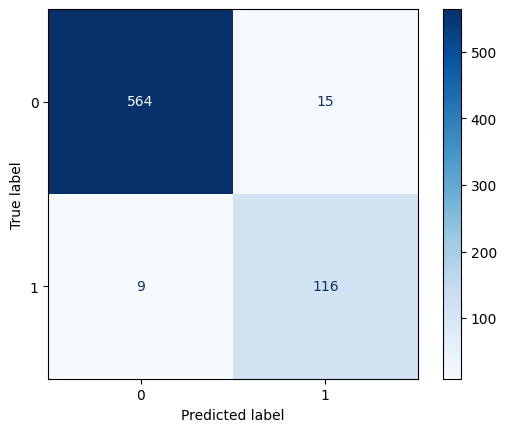

In [ ]:
# Creating a Confusion matrix with the predictions of the model on the testing set
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict the probability for each class
probabilities = sclf.predict_proba(x_test)[:,1]

# Since a False Negative is more dangerous then a False Positive (we want to identify all possible threats), we will set the threshold below 0.5
threshold = 0.4

y_pred = np.where(probabilities > threshold, 1, 0)

# Building and displaying the confusion matrix
cm = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred))
cm.plot(cmap = plt.cm.Blues)
plt.show()

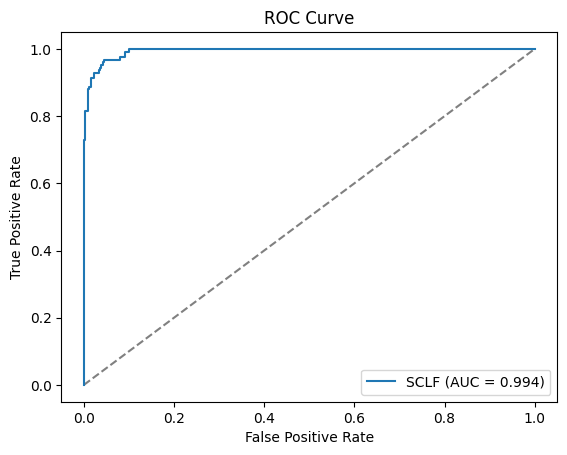

In [ ]:
from sklearn.metrics import roc_curve, auc

probabilities = sclf.predict_proba(x_test)[:,1]

fpr_sclf, tpr_sclf, thresholds_sclf = roc_curve(y_test, probabilities)
auc_sclf = round(auc(fpr_sclf, tpr_sclf), 4)

plt.figure(1)
plt.plot([0, 1], [0, 1], '--', color = "grey")
plt.plot(fpr_sclf, tpr_sclf, label = f"SCLF (AUC = {auc_sclf})")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

In [ ]:
y_pred = sclf.predict(x_test)

# Computing Accuracy, Precision, Recall and F1 Score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

acc_sclf = round(accuracy_score(y_test,y_pred), 4)
precision_sclf = round(precision_score(y_test,y_pred), 4)
recall_sclf = round(recall_score(y_test,y_pred), 4)
f1_score_sclf = round(f1_score(y_test,y_pred), 4)

print("Accuracy =", acc_sclf)
print("Precision =", precision_sclf)
print("Recall =", recall_sclf)
print("F1 Score =", f1_score_sclf)
print("Area Under the Curve", auc_sclf)

Accuracy = 0.9702
Precision = 0.9194
Recall = 0.912
F1 Score = 0.9157
Area Under the Curve 0.994


## Resuming table

In [ ]:
from beautifultable import BeautifulTable
table = BeautifulTable(max_width=90)
table.rows.append(["Neural Network", auc_nn, f1_score_nn, acc_nn, precision_nn, recall_nn, nn_training_time])
table.rows.append(["Stacking CLF", auc_sclf, f1_score_sclf, acc_sclf, precision_sclf, recall_sclf, sclf_training_time])
table.rows.append(["kNN", "NA", f1_score_knn, acc_knn, precision_knn, recall_knn, knn_training_time])
table.rows.append(["SVM", "NA", f1_score_svc, acc_svc, precision_svc, recall_svc, svc_training_time])
table.rows.append(["Bagging SVM", "NA", f1_score_bclf, acc_bclf, precision_bclf, recall_bclf, bclf_training_time])
table.columns.header = ["Model", "AUC", "F1-Score", "Accuracy", "Precision", "Recall", "Training time"]
table.rows.header = ["M1", "M2", "M3", "M4", "M5"]
table.set_style(BeautifulTable.STYLE_COMPACT)
print(table)

          Model         AUC    F1-Score   Accuracy   Precision   Recall   Training time 
---- ---------------- ------- ---------- ---------- ----------- -------- ---------------
 M1   Neural Network   0.999    0.954      0.986       0.946     0.963       168.274    
 M2    Stacking CLF    0.994    0.916       0.97       0.919     0.912        1.505     
 M3        kNN          NA      0.802      0.938       0.788     0.816        0.005     
 M4        SVM          NA      0.871      0.962       0.884     0.858        0.156     
 M5    Bagging SVM      NA      0.845      0.953       0.826     0.865        0.741     


From the non Neural Network models, the Stacking Classifier got the best score.

The Stacking Classifier is not as good as the Neural Network, but trains in way less time and only is slighly worse. Even if we train the Neural Network in a small number of epoch (ex: 15), it takes way more time and the result is pratically the same in terms of auc/f1-score (we need to take in account that we are comparing AUC and f1-score calculated on the training set in the Neural Network versus in the testing set in the Stacking Classifier, which is unfair to the Stacking Classifier).

# Insights

Conduct Permutation Importance

*  Defined to be the decrease in a model score when a single feature value is randomly shuffled


In [ ]:
from mlxtend.evaluate import feature_importance_permutation

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(sclf, x_test, y_test,
                        n_repeats=30,
                      random_state=0)

See Results of Permutation Importance

In [ ]:
for i in r.importances_mean.argsort()[::-1]:
  if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
    print(f"{sclf.feature_names_in_[i]:<8} "
          f"{r.importances_mean[i]:.3f}"
          f" +/- {r.importances_std[i]:.3f}")

Minimum Orbit Intersection 0.223 +/- 0.012
Absolute Magnitude 0.176 +/- 0.012
Orbit Uncertainity 0.024 +/- 0.006
Inclination 0.015 +/- 0.004
Perihelion Distance 0.009 +/- 0.004
Est Dia in KM(max) 0.008 +/- 0.003
Orbital Period 0.003 +/- 0.001


Create a Dataframe of Scores of Permutation Importance

In [ ]:
# Initialize a list of results
results = []
# Iterate through each predictor
for i in r.importances_mean.argsort()[::-1]:
    results.append({'Feature': sclf.feature_names_in_[i],
                    'Score': r.importances_mean[i]})

# Convert to a pandas dataframe and rank the predictors by score
resultsdf = pd.DataFrame(results).sort_values(by = 'Score',
                                              ascending = False)

resultsdf

,Feature,Score
0,Minimum Orbit Intersection,0.223201
1,Absolute Magnitude,0.176231
2,Orbit Uncertainity,0.024290
3,Inclination,0.014820
4,Perihelion Distance,0.009233
5,Est Dia in KM(max),0.007623
6,Perihelion Arg,0.005540
7,Jupiter Tisserand Invariant,0.005019
8,Miss Dist.(kilometers),0.004972
9,Mean Anomaly,0.004877


Visualise Results of Permutation Importance

There are two main features that are most important in determining whether an asteroid is hazardous or not, in decreasing order:
*   Minimum Orbit Intersection (0.223)
*   Absolute Magnitude (0.176)



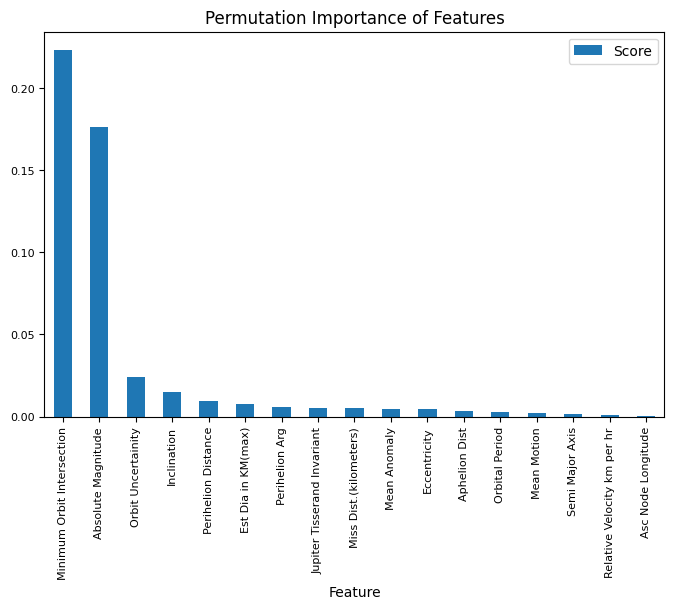

In [ ]:
ax = resultsdf.plot.bar(rot=90, y="Score", x="Feature",title='Permutation Importance of Features', figsize=(8,5), fontsize=8)